In [1]:
import os
import gc
from tqdm import tqdm
import illustris_python as il
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from scipy.ndimage import gaussian_filter
# %matplotlib widget
basePath = "./sims.TNG/TNG50-1/output"

Snapshot_Init = 71
Snapshot_End = 99
Lbsg_Indcies_Array = np.array(
    [117251, 300903, 324123, 329508, 382215,
        400973, 419618, 457431, 460722, 490814]
)

h = 0.6774  # km/Mpc

m_dm = 4.5e-5  # E10M_Sum
m_dm_h = m_dm * h

Critial_Density = 1.27e-8  # E10M_Sum/kpc^3
Critial_Density_h = Critial_Density / h**2  # E10M_Sum/(kpc/h)^3


In [2]:
PartType4_Fields = ["Masses", "GFM_StellarFormationTime", "Coordinates"]
PartType0_Fields = ["Coordinates", "Masses", "NeutralHydrogenAbundance"]


In [4]:
Current_Snapshot = 99
Subhalo_Index = 329508
PartType4_Dict = il.snapshot.loadSubhalo(
    basePath, Current_Snapshot, Subhalo_Index, 4, PartType4_Fields)


In [31]:
old_indices=np.where(PartType4_Dict['GFM_StellarFormationTime']>0.3)[0]
new_indices=np.where(PartType4_Dict['GFM_StellarFormationTime']<0.3)[0]


In [39]:
hist, xedges, yedges = np.histogram2d(PartType4_Dict['Coordinates'][old_indices,1],
                                      PartType4_Dict['Coordinates'][old_indices,2],
                                      bins=(900, 900),
                                      range=[[19800, 20400],[21800, 22400]])



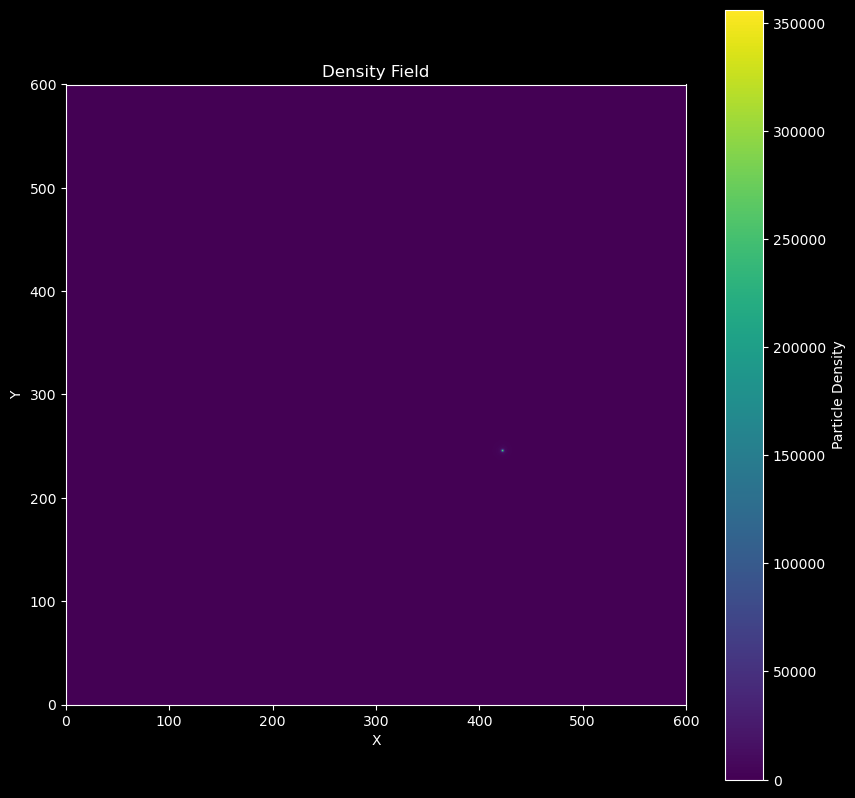

In [40]:
hist_figure = gaussian_filter(hist,
                       sigma=0)  # Apply Gaussian smoothing for visualization

# Create the plot
plt.figure(figsize=(10, 10))
plt.imshow(hist_figure.T, extent=[ 0,600,0,600], origin='lower', cmap='viridis')
plt.colorbar(label='Particle Density')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Density Field')
plt.show()


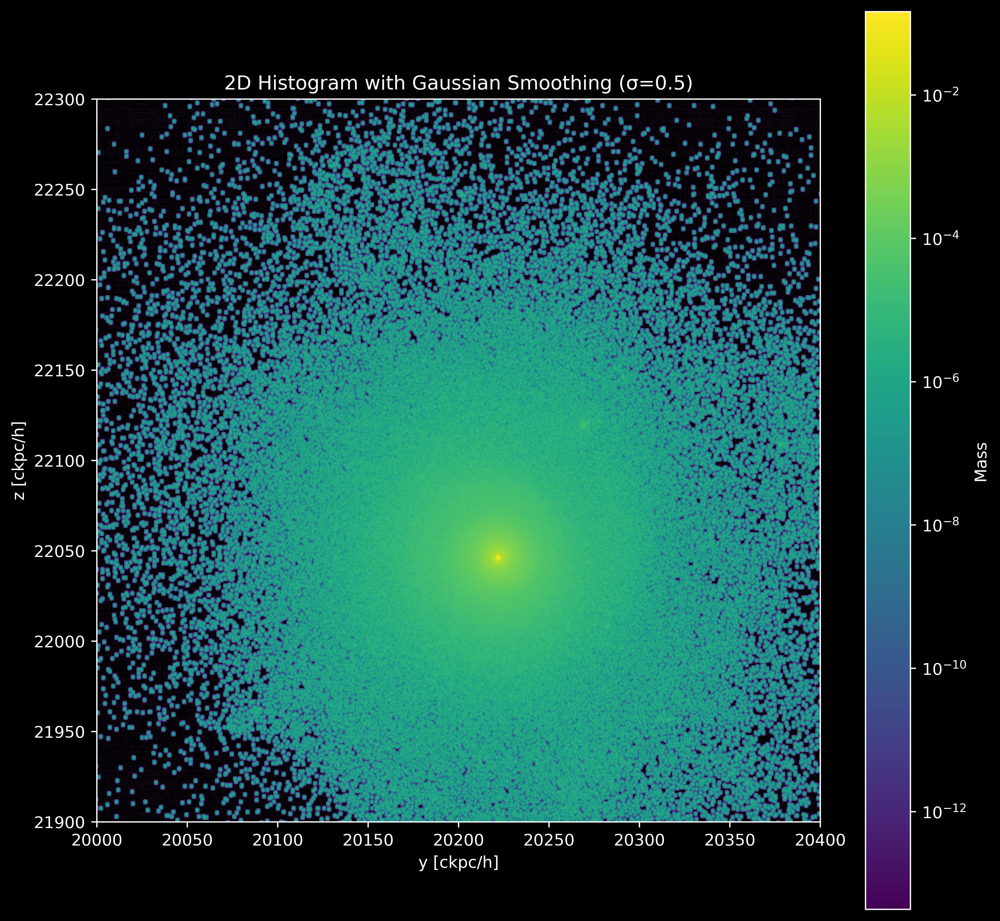

In [47]:
plt.figure(figsize=(10, 10), dpi=400)
plt.style.use("dark_background")

# Your data
x_data = PartType4_Dict['Coordinates'][new_indices, 1]
y_data = PartType4_Dict['Coordinates'][new_indices, 2]
weights = PartType4_Dict['Masses'][new_indices]

# Create the 2D histogram without smoothing
h, xedges, yedges, image = plt.hist2d(x_data, y_data, weights=weights,
                                      norm=mpl.colors.LogNorm(), bins=(2000, 2000))

# Apply Gaussian smoothing
sigma = 0.5  # You can adjust the standard deviation (sigma) for smoothing
h_smoothed = gaussian_filter(h, sigma=sigma)

# Plot the smoothed data
plt.clf()  # Clear the previous figure
plt.imshow(h_smoothed.T, extent=(xedges.min(), xedges.max(), yedges.min(), yedges.max()),
           aspect='auto', origin='lower', cmap='viridis', norm=mpl.colors.LogNorm())

# Set axis limits
plt.ylim([21900, 22300])
plt.xlim([20000, 20400])

# Set labels and colorbar
plt.xlabel('y [ckpc/h]')
plt.ylabel('z [ckpc/h]')
plt.colorbar(label='Mass')
plt.gca().set_aspect(1)
plt.title(f'2D Histogram with Gaussian Smoothing (σ={sigma})')
plt.show()


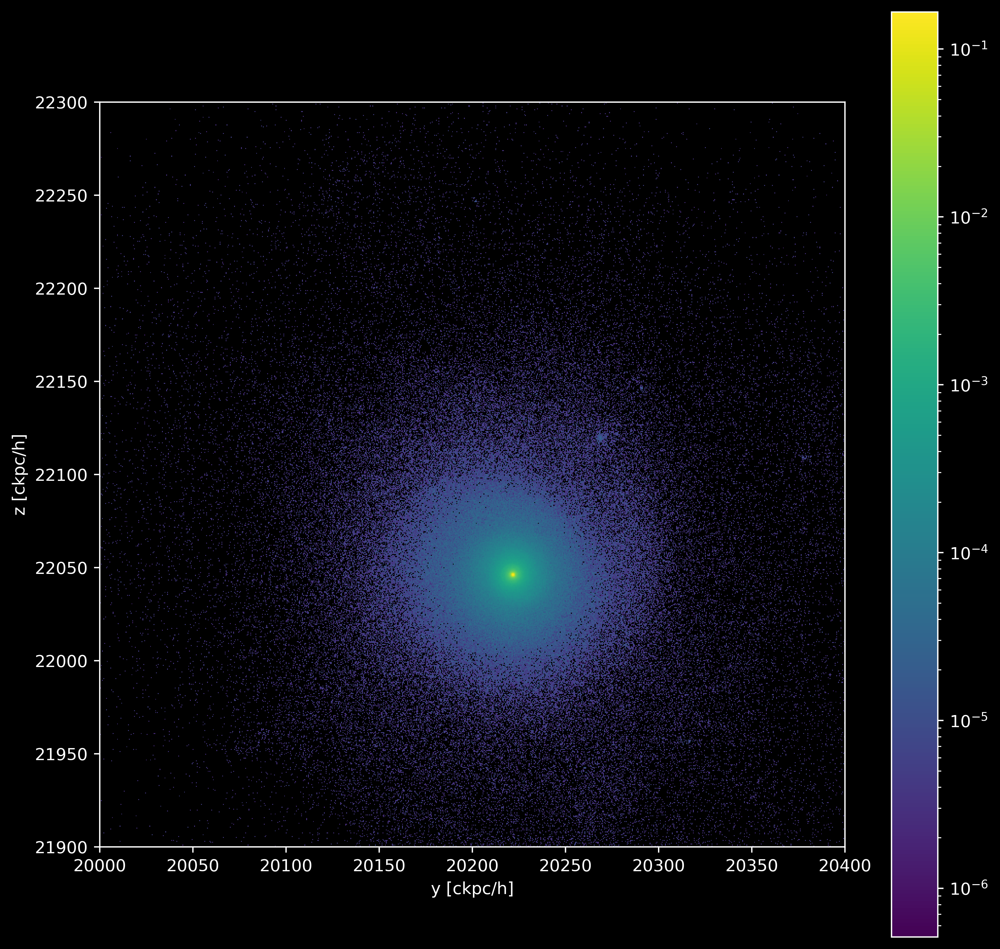

In [45]:
plt.figure(figsize=(10, 10), dpi=400)

plt.style.use("dark_background")

h, _, _, image = plt.hist2d(PartType4_Dict['Coordinates'][new_indices,1],
                            PartType4_Dict['Coordinates'][new_indices,2],
                            weights=PartType4_Dict['Masses'][new_indices],
                            #cmin=1E-6,
                            norm=mpl.colors.LogNorm(),
                            bins=(2000, 2000))
plt.ylim([21900, 22300])
plt.xlim([20000, 20400])
plt.xlabel('y [ckpc/h]')
plt.ylabel('z [ckpc/h]')
plt.colorbar(image)
plt.gca().set_aspect(1)
plt.show()


In [3]:
Current_Snapshot = 99
Subhalo_Index = 329508
PartType0_Dict = il.snapshot.loadSubhalo(
    basePath, Current_Snapshot, Subhalo_Index, 0, PartType0_Fields)


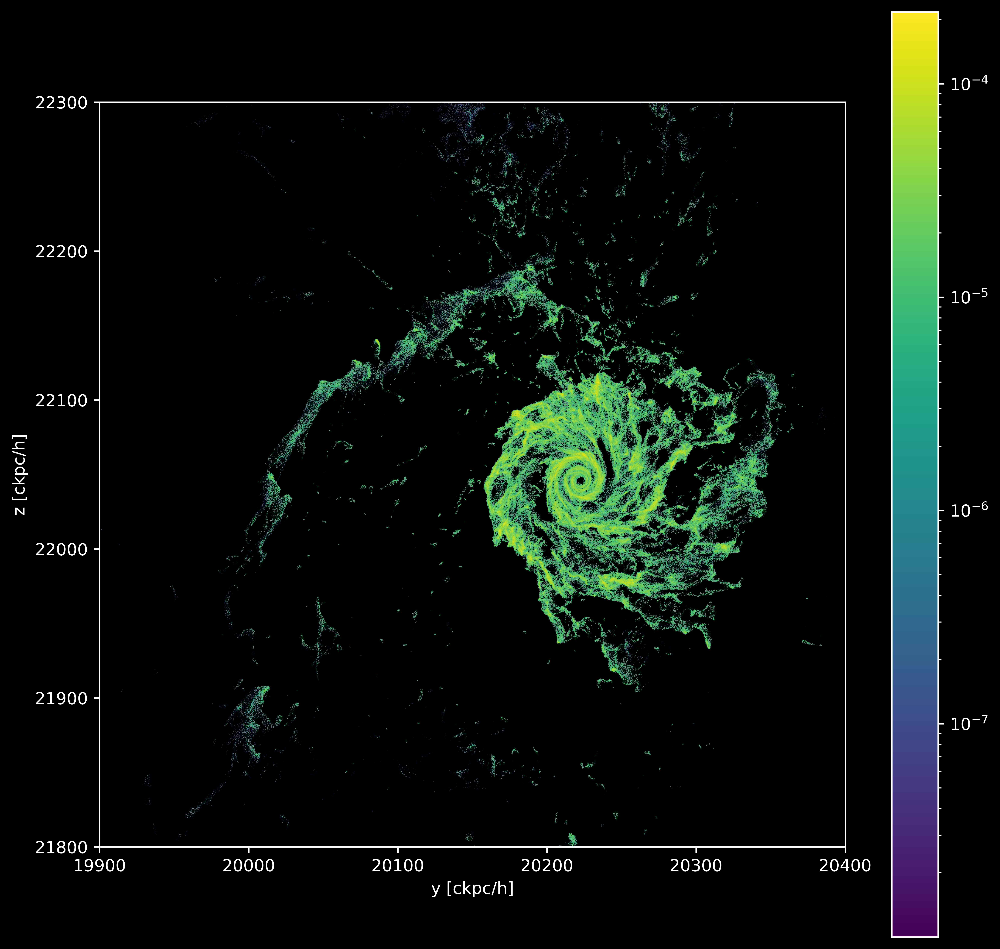

In [58]:
plt.figure(figsize=(10, 10), dpi=800)

plt.style.use("dark_background")

h, _, _, image = plt.hist2d(PartType0_Dict['Coordinates'][:,1],
                            PartType0_Dict['Coordinates'][:,2],
                            weights=PartType0_Dict['Masses']*PartType0_Dict['NeutralHydrogenAbundance'],
                            norm=mpl.colors.LogNorm(),
                            cmin=1e-8,
                            bins=(5000, 5000))
plt.ylim([21800, 22300])
plt.xlim([19900, 20400])
plt.xlabel('y [ckpc/h]')
plt.ylabel('z [ckpc/h]')
plt.colorbar(image)
plt.gca().set_aspect(1)
plt.show()
